### Description
Fine-tuning SuperGlue for Sentinel-2 Feature Matching: Benchmarking against LoFTR and Pretrained Baselines.

### Overview
This notebook demonstrates the inference capabilities of a fine-tuned SuperGlue model designed for multi-temporal satellite imagery. It showcases:
- Cross-Seasonal Matching: Successfully aligning image pairs with drastic appearance changes (Winter/Snow).
- Model Comparison: Benchmarking the fine-tuned model against LoFTR (detector-free) and the Pretrained SuperGlue (outdoor weights).
- Robustness Analysis: Evaluating performance on edge cases using variable geometric error thresholds (3px, 5px, 10px) to account for GSD.
- Quantitative Evaluation: Detailed metrics on the test set, specifically focusing on Precision, Inlier Count, and Matching Recall.

### Setup & Configuration

In [ ]:
%load_ext autoreload
%autoreload 2

import os
import sys
import warnings
from pathlib import Path

import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from huggingface_hub import hf_hub_download

# Suppress annoying warnings from Rasterio/Torch for a clean demo
warnings.filterwarnings("ignore")

# Setup Plotting Style
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['image.cmap'] = 'gray'

print("Libraries imported successfully.")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Libraries imported successfully.


### Dataset Context: Winter vs. Summer
The challenge is aligning features where appearance is drastically different (snow vs. summer).

Here is the visualisation of *Kyiv Oblast | Tile T36UUA*:

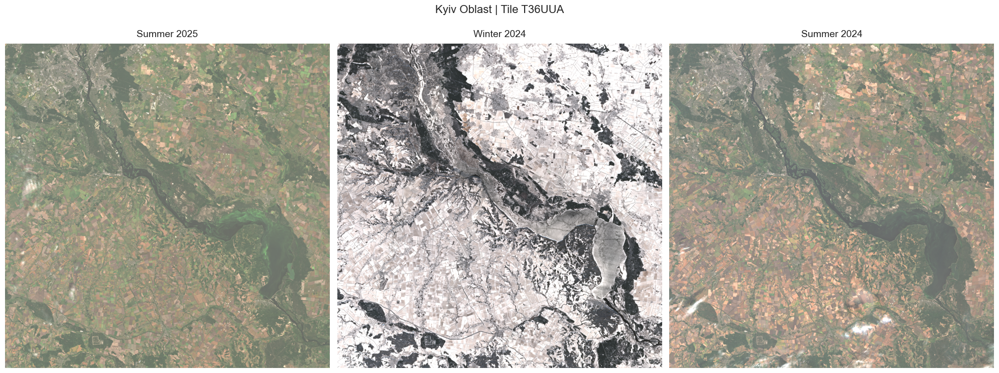

In [ ]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

# Adjust if your notebook is in a subfolder (e.g., notebooks/)
script_dir = Path.cwd()
project_dir = script_dir.parent
assets_dir = project_dir / "assets"

if str(project_dir) not in sys.path:
    sys.path.append(str(project_dir))
    print(f"✅ Added to sys.path: {project_dir}")

def show_dataset_comparison():
    """
    Displays the three specific preview images from the assets folder.
    """

    data_map = {
        "Summer 2025": "summer_2025_prev.png",
        "Winter 2024": "winter_2024_prev.png",
        "Summer 2024": "summer_2024_prev.png"
    }
    
    images = []
    titles = []

    for title, filename in data_map.items():
        path = assets_dir / filename
        
        if path.exists():
            # OpenCV loads as BGR, convert to RGB for Matplotlib
            img = cv2.imread(str(path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append(img)
            titles.append(title)
        else:
            print(f"❌ File not found: {filename}")
            return

    # Plot Side-by-Side
    fig, axes = plt.subplots(1, 3, figsize=(20, 8))

    fig.suptitle("Kyiv Oblast | Tile T36UUA", fontsize=16, y=0.98)
    
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title, fontsize=14, pad=10)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_dataset_comparison()

### Visualisation of results
Let's visually compare how models perform on a single subtile with different GSD errors.

In [ ]:
import contextlib
import matplotlib.pyplot as plt
import cv2
import glob
from pathlib import Path
from types import SimpleNamespace
from src.inference import run_inference, data_dir

def run_and_visualize(subtile_idx, tile="T35UNQ", threshold=10.0):
    """
    Runs inference, plots the visual results, AND returns the statistics DataFrame.
    """
    # Setup Arguments & Run Inference
    print(f"Running Inference on Subtile {subtile_idx} (Thresh: {threshold}px)...")
    
    args = SimpleNamespace(
        data_path=data_dir,
        test_tile=tile,
        test=False,
        predict=subtile_idx,
        ransac_thresh=threshold
    )
    
    # Redirects all 'print' statements inside this block to the trash bin
    with open(os.devnull, "w") as f, contextlib.redirect_stdout(f), contextlib.redirect_stderr(f):
        df_stats = run_inference(args)

    # Find the generated images dynamically
    output_dir = project_dir / "output" 
    search_pattern = f"pred_{tile}_{subtile_idx}_*_{int(threshold)}px.png"
    image_paths = sorted(list(output_dir.glob(search_pattern)))

    if not image_paths:
        print(f"No images found matching pattern: {search_pattern}")
        return df_stats # Return stats even if plot fails (e.g. if images weren't saved)

    # Plot Vertical Grid (Column)
    num_imgs = len(image_paths)
    fig, axes = plt.subplots(num_imgs, 1, figsize=(12, 6 * num_imgs))
    
    if num_imgs == 1: axes = [axes]

    for ax, img_path in zip(axes, image_paths):
        img = cv2.imread(str(img_path))
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        fname = img_path.stem
        # Clean up filename for display
        clean_name = fname.replace(f"pred_{tile}_{subtile_idx}_", "").replace(f"_{int(threshold)}px", "")
        clean_name = clean_name.replace("_", " ")

        ax.imshow(img)
        # Optional: Add title to each subplot
        # ax.set_title(clean_name, fontsize=16, fontweight='bold', pad=10)
        ax.axis('off')

    plt.suptitle(f"Tile: {tile} | Subtile #{subtile_idx}", fontsize=20, y=1.005)
    plt.tight_layout()
    plt.show()
    
    # Return the Stats Table
    return df_stats


Running Inference on Subtile 0 (Thresh: 10.0px)...


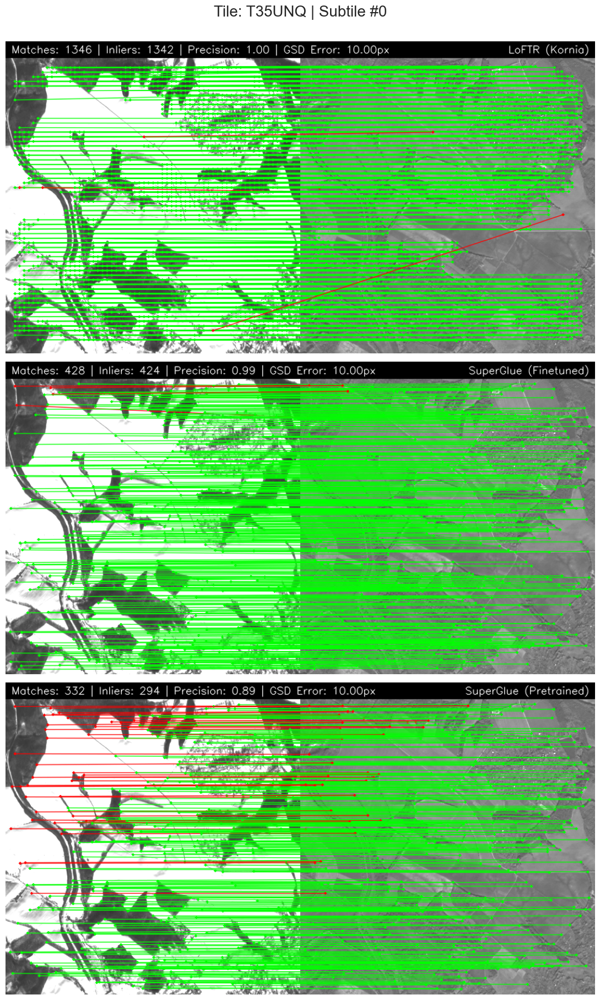

In [15]:
df_t10 = run_and_visualize(subtile_idx=0, threshold=10.0)

Running Inference on Subtile 0 (Thresh: 5.0px)...


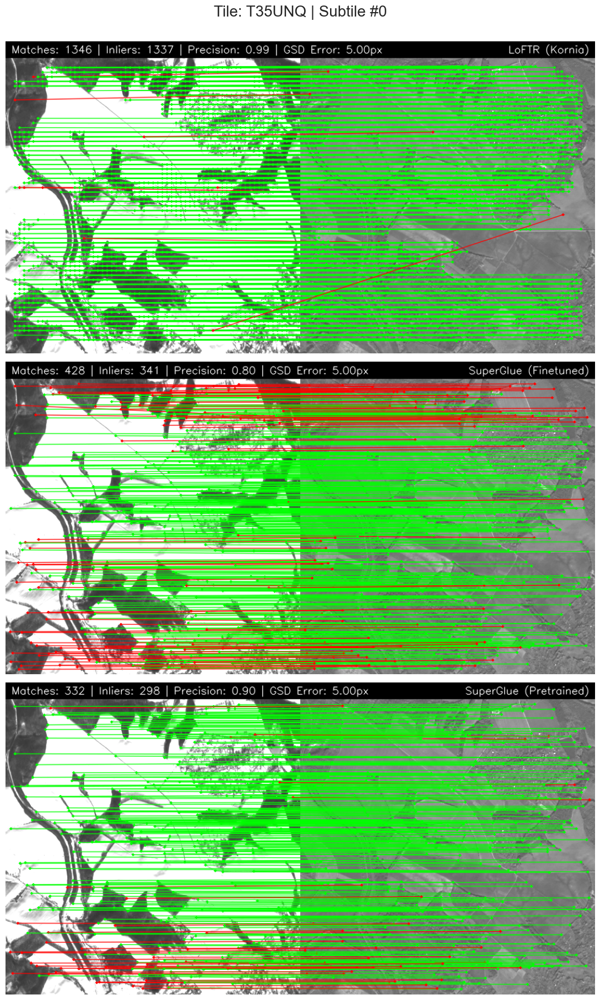

In [16]:
df_t5 = run_and_visualize(subtile_idx=0, threshold=5.0)

Running Inference on Subtile 0 (Thresh: 3.0px)...


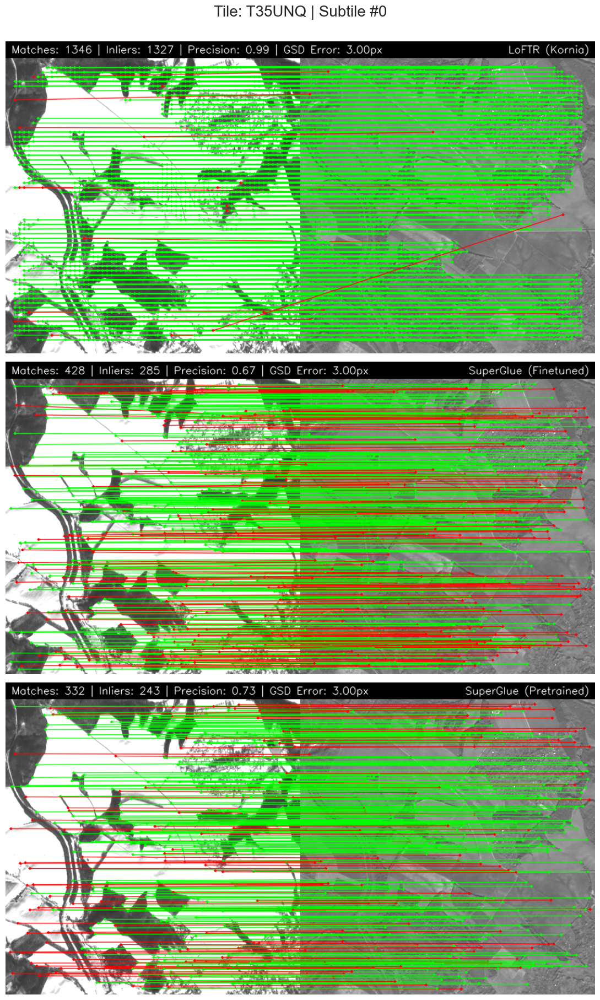

In [17]:
df_t3 = run_and_visualize(subtile_idx=0, threshold=3.0)

In [18]:
# Display the table with the stats
print("\nStatistical Comparison of A SINGLE INFERENCE for GSD 10px:")
display(df_t10)

print("\nStatistical Comparison of A SINGLE INFERENCE for GSD 5px:")
display(df_t5)

print("\nStatistical Comparison of A SINGLE INFERENCE for GSD 3px:")
display(df_t3)


Statistical Comparison of A SINGLE INFERENCE for GSD 10px:


,Model,Threshold (px),Matches,Inliers,Precision
0,LoFTR (Kornia),10.0,1346,1342,0.997028
1,SuperGlue (Pretrained),10.0,332,294,0.885542
2,SuperGlue (Finetuned),10.0,428,424,0.990654



Statistical Comparison of A SINGLE INFERENCE for GSD 5px:


,Model,Threshold (px),Matches,Inliers,Precision
0,LoFTR (Kornia),5.0,1346,1337,0.993314
1,SuperGlue (Pretrained),5.0,332,298,0.897590
2,SuperGlue (Finetuned),5.0,428,341,0.796729



Statistical Comparison of A SINGLE INFERENCE for GSD 3px:


,Model,Threshold (px),Matches,Inliers,Precision
0,LoFTR (Kornia),3.0,1346,1327,0.985884
1,SuperGlue (Pretrained),3.0,332,243,0.731928
2,SuperGlue (Finetuned),3.0,428,285,0.665888


### Single-Inference Analysis
This specific test case highlights how each model handles geometric strictness (GSD error) on a challenging Winter-Summer pair.
- Robustness at 10px: Both SuperGlue models perform well with a 10px margin (approx. 100m error), with the Fine-tuned model achieving 99% precision, significantly outperforming the Pretrained model's 88%.

- Noise(jitter) at 5px & 3px: As the threshold tightens to 5px and 3px, the Fine-tuned SuperGlue's precision drops sharply (from 99% to 66%). This indicates that while the model finds the correct features, the localization has a slight spatial jitter.

- LoFTR's Dominance: LoFTR maintains extremely high precision (>98%) even at the strict 3px threshold.

In [ ]:
import pandas as pd
import contextlib
import os
from types import SimpleNamespace
from src.inference import run_inference, data_dir

def run_sensitivity_sweep(thresholds=[1, 3, 5, 10], tile="T35UNQ"):
    """
    Runs the benchmark multiple times with different thresholds and merges results.
    """
    all_results = []
    
    # Loop over thresholds
    for thr in thresholds:
        print(f"   ... Testing @ {thr}px")
        
        args = SimpleNamespace(
            data_path=data_dir,
            test_tile=tile,
            test=True,          # Trigger full eval
            predict=None,
            ransac_thresh=float(thr)
        )
        
        # Silence the inner prints/tqdm
        with open(os.devnull, "w") as f, contextlib.redirect_stdout(f), contextlib.redirect_stderr(f):
            df = run_inference(args)
            
        if df is not None:
            df["Threshold"] = thr
            all_results.append(df)

    if not all_results: return None

    # Combine into one big DataFrame
    final_df = pd.concat(all_results, ignore_index=True)
    return final_df

# This might take a minute or two
df_sweep = run_sensitivity_sweep(thresholds=[3, 5, 8, 10], tile="T35UNQ")

   ... Testing @ 3px
   ... Testing @ 5px
   ... Testing @ 8px
   ... Testing @ 10px


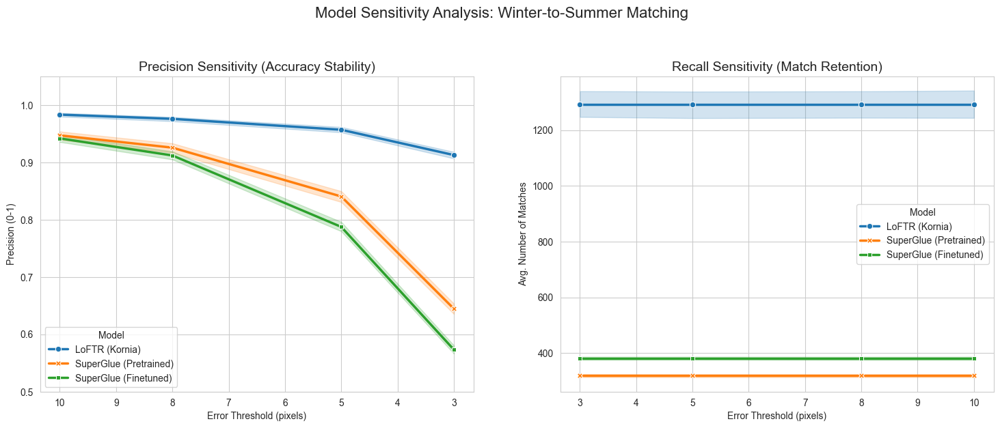

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_sensitivity_curves(df):
    sns.set_style("whitegrid")
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Precision vs Threshold (Does accuracy drop?)
    sns.lineplot(data=df, x="Threshold", y="Precision", hue="Model", 
                 style="Model", markers=True, dashes=False, linewidth=2.5, ax=axes[0])
    axes[0].set_title("Precision Sensitivity (Accuracy Stability)", fontsize=14)
    axes[0].set_ylabel("Precision (0-1)")
    axes[0].set_xlabel("Error Threshold (pixels)")
    axes[0].set_ylim(0.5, 1.05)
    axes[0].invert_xaxis()

    # Matches vs Threshold (Do we lose matches?)
    sns.lineplot(data=df, x="Threshold", y="Matches", hue="Model", 
                 style="Model", markers=True, dashes=False, linewidth=2.5, ax=axes[1])
    axes[1].set_title("Recall Sensitivity (Match Retention)", fontsize=14)
    axes[1].set_ylabel("Avg. Number of Matches")
    axes[1].set_xlabel("Error Threshold (pixels)")

    plt.suptitle(f"Model Sensitivity Analysis: Winter-to-Summer Matching", fontsize=16, y=1.05)
    plt.show()

# Visualize
if df_sweep is not None:
    plot_sensitivity_curves(df_sweep)

### Final Analysis:
We benchmarked three models on Sentinel-2 satellite imagery, evaluating their robustness against seasonal appearance changes (Snow vs Summer). The sensitivity analysis reveals three key findings:

1. The Dominance of Dense Matching (LoFTR)
LoFTR establishes the upper bound for performance, achieving:

- Highest Recall: ~1,300 matches per image (4x more than sparse methods).

- Highest Stability: >95% precision even at 3px threshold.

- Why: Detector-free architecture allows it to find correspondences in low-texture areas (snow fields) where detector-based methods (SuperPoint) fail to find interest points. It also performs sub-pixel refinement, making it stable against localization jitter.

2. The Fine-Tuning Trade-off
Comparing the Pretrained vs Fine-tuned SuperGlue reveals a behavior change:

- Recall Gain: The fine-tuning successfully taught the model to bridge the gap between seasons. It finds ~25% more matches (380 vs. 300) than the pretrained weights.

- Precision Drop at Low Tolerance (trade-off): At low thresholds (<5px), the fine-tuned model’s precision drops below the pretrained model.

- Possible interpretation: The pretrained model only matches the "easy," distinct features, which are spatially accurate. The fine-tuned model is aggressively matches seasonal features.

3. Conclusion
- For satellite georeferencing where a 10px error (100m) is often within the acceptable margin for coarse alignment, the Fine-tuned SuperGlue is superior to the pretrained version because it provides a denser graph of connections.

- However, the drop in precision at 3px indicates that SuperPoint's keypoint detection (which we froze during the training) is the bottleneck for pixel-perfect accuracy on snow, not the SuperGlue matching logic itself.